# Installing Libraries

In [14]:
pip install plotly


   ---------------------------------------- 0.0/19.1 MB ? eta -:--:--
   - -------------------------------------- 0.5/19.1 MB 3.4 MB/s eta 0:00:06
   -- ------------------------------------- 1.3/19.1 MB 3.7 MB/s eta 0:00:05
   ---- ----------------------------------- 2.4/19.1 MB 3.8 MB/s eta 0:00:05
   ------- -------------------------------- 3.7/19.1 MB 4.6 MB/s eta 0:00:04
   ----------- ---------------------------- 5.5/19.1 MB 5.4 MB/s eta 0:00:03
   -------------- ------------------------- 7.1/19.1 MB 5.7 MB/s eta 0:00:03
   ----------------- ---------------------- 8.4/19.1 MB 5.8 MB/s eta 0:00:02
   ---------------------- ----------------- 10.5/19.1 MB 6.4 MB/s eta 0:00:02
   -------------------------- ------------- 12.6/19.1 MB 6.7 MB/s eta 0:00:01
   ----------------------------- ---------- 14.2/19.1 MB 6.8 MB/s eta 0:00:01
   ---------------------------------- ----- 16.3/19.1 MB 7.1 MB/s eta 0:00:01
   ------------------------------------- -- 18.1/19.1 MB 7.2 MB/s eta 0:00:01


# Importing Required Libraries

In [64]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import seaborn as sns
import os
import plotly.express as px

# Load Dataset

In [3]:
df = pd.read_csv(r"X:\Data Science\Capstone projects\Kaggle Projects\Multi - label classification\train.csv")
df

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
159566,ffe987279560d7ff,""":::::And for the second time of asking, when ...",0,0,0,0,0,0
159567,ffea4adeee384e90,You should be ashamed of yourself \n\nThat is ...,0,0,0,0,0,0
159568,ffee36eab5c267c9,"Spitzer \n\nUmm, theres no actual article for ...",0,0,0,0,0,0
159569,fff125370e4aaaf3,And it looks like it was actually you who put ...,0,0,0,0,0,0


# Data Analysis

In [4]:
df.isnull().sum()

id               0
comment_text     0
toxic            0
severe_toxic     0
obscene          0
threat           0
insult           0
identity_hate    0
dtype: int64

In [5]:
df.columns

Index(['id', 'comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat',
       'insult', 'identity_hate'],
      dtype='object')

In [6]:
labels = [ 'toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate']

label_counts = df[labels].sum()
label_count_df = label_counts.reset_index()
label_count_df.columns = ["Label", 'count']

label_count_df


,Label,count
0,toxic,15294
1,severe_toxic,1595
2,obscene,8449
3,threat,478
4,insult,7877
5,identity_hate,1405


### Plotting Bar chart for counts of each toxic labels

In [7]:

fig = px.bar(label_count_df, x = "Label", y = 'count', title = 'Counts for Each Toxic Labels',
             width = 1500, height = 1000)
fig.show()

# How many comments are labeled with multiple toxic categories


In [34]:
toxic_labels =  df['multi_label'].value_counts().reset_index()
toxic_labels.columns = ["labels", 'label_count']
toxic_labels

,labels,label_count
0,0,143346
1,1,6360
2,3,4209
3,2,3480
4,4,1760
5,5,385
6,6,31


In [28]:
toxic_labels

count
0    143346
1      6360
3      4209
2      3480
4      1760
5       385
6        31
Name: count, dtype: int64

In [42]:
Total_commnets = toxic_labels['label_count'].sum()
toxic_labels['Percentage'] = (toxic_labels['label_count']/Total_commnets)*100
toxic_labels

,labels,label_count,Percentage
0,0,143346,89.832112
1,1,6360,3.985687
2,3,4209,2.637697
3,2,3480,2.180847
4,4,1760,1.102957
5,5,385,0.241272
6,6,31,0.019427


In [35]:
fig = px.bar(toxic_labels, x = 'labels', y= 'label_count', title = "Distribution of comments with Multi_label_count")
fig.show()

Above i have checked the Distribution of data with mutliple commnets.

Total labels:-  'toxic', 'severe_toxic', 'obscene', 'threat','insult', 'identity_hate'

1. Normal commnets more in the dataset. Allmost 143.346K commnets are Normal commnets only


# Analyze most common combinations of toxic labels

In [48]:
def get_row_label(row):
    return tuple([label for label, value in zip(labels, row) if value == 1])


In [51]:
df['combination_labels'] = df[labels].apply(get_row_label, axis = 1)

combination_name = df['combination_labels'].value_counts().reset_index()
combination_name.columns = ["toxic_combination", "count"]
combination_name.head(10)


,toxic_combination,count
0,(),143346
1,"(toxic,)",5666
2,"(toxic, obscene, insult)",3800
3,"(toxic, obscene)",1758
4,"(toxic, insult)",1215
5,"(toxic, severe_toxic, obscene, insult)",989
6,"(toxic, obscene, insult, identity_hate)",618
7,"(obscene,)",317
8,"(insult,)",301
9,"(toxic, severe_toxic, obscene, insult, identit...",265


# Labels correlation

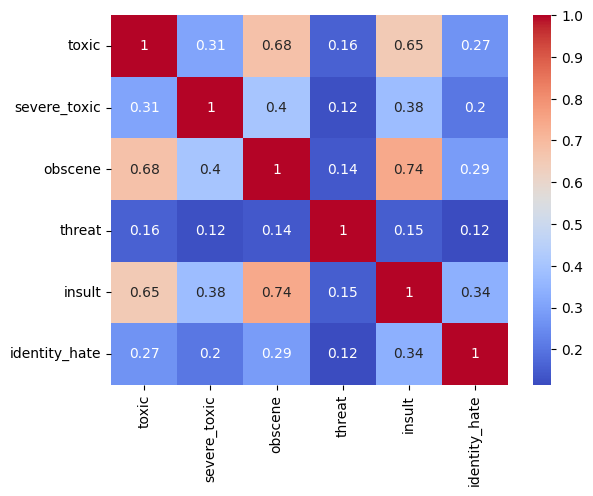

In [57]:
sns.heatmap(df[labels].corr(), annot = True, cmap= 'coolwarm')
plt.show()

Corelation represents that there is strong overlaping betwen insult, obscene, and toxic. These are strong correlated, in ov

# Text_Data Insights

Analyzing the text data comment length, calculate the length of the commnets, so the can investige how the length of the comment will change with respect to toxic and non toxic comments

In [59]:

df["comment_length_characters"] = df["comment_text"].apply(len)
df["comment_length_words"] = df["comment_text"].apply(lambda x: len(x.split()))
df["is_toxic"] = df[labels].max(axis=1)

# 1. Visualization for comment length by characters
fig_char = px.box(df, x="is_toxic", y="comment_length_characters", 
                  labels={"is_toxic": "Toxic (1) or Non-Toxic (0)", "comment_length_characters": "Comment Length (Characters)"},
                  title="Comment Length (Characters) by Toxic vs Non-Toxic Comments")
fig_char.show()

# 2. Visualization for comment length by words
fig_words = px.box(df, x="is_toxic", y="comment_length_words", 
                   labels={"is_toxic": "Toxic (1) or Non-Toxic (0)", "comment_length_words": "Comment Length (Words)"},
                   title="Comment Length (Words) by Toxic vs Non-Toxic Comments")
fig_words.show()

1. **Comparable Medians:** The median lengths of both toxic and non-toxic comments are quite close, indicating that typical comment lengths don't differ much between the two groups. The boxes, representing the interquartile range (IQR), show that most comments in both categories tend to be short.

2. **Presence of Long Outliers:** Both toxic and non-toxic comments include notable outliers, particularly on the higher end of the length scale. Some comments in both groups exceed 1,000 characters, showing that very long comments exist in both categories, though they are uncommon.

3. **Broader Range for Non-Toxic Comments:** The overall range of comment lengths is slightly greater for non-toxic comments, indicating a more diverse length distribution compared to toxic comments.

In [65]:
# Separate toxic and non-toxic comments
toxic_data = df[df['is_toxic'] == 1]
non_toxic_data = df[df['is_toxic'] == 0]

# 1. Distribution of comment length by characters
char_lengths = [toxic_data['comment_length_characters'], non_toxic_data['comment_length_characters']]
labels_char = ['Toxic', 'Non-Toxic']

char_dist_plot = ff.create_distplot(char_lengths, labels_char, show_hist=True, show_rug=False,
                                    curve_type='kde', colors=['red', 'blue'])
char_dist_plot.update_layout(title='Character Length Distribution: Toxic vs Non-Toxic Comments')
char_dist_plot.show()

# 2. Distribution of comment length by words
word_lengths = [toxic_data['comment_length_words'], non_toxic_data['comment_length_words']]
labels_words = ['Toxic', 'Non-Toxic']

word_dist_plot = ff.create_distplot(word_lengths, labels_words, show_hist=True, show_rug=False,
                                    curve_type='kde', colors=['red', 'blue'])
word_dist_plot.update_layout(title='Word Length Distribution: Toxic vs Non-Toxic Comments')
word_dist_plot.show()


The distribution of comment lengths (in characters) for both toxic and non-toxic comments reveals:

1. **Right-Skewed Distribution:** Both toxic and non-toxic comments tend to be short, with a few long outliers.
   
2. **Toxic Comments Peak Earlier:** Toxic comments have a higher density at shorter lengths, peaking sooner than non-toxic ones.
   
3. **Shorter Toxic Comments:** Toxic comments are more frequent in the lower character range, especially under 500 characters.

4. **Few Long Toxic Comments:** Toxic comments become less frequent as the length increases beyond 500 characters.

5. **Outliers at Longer Lengths:** Both groups contain a few extreme long comments, though these are rare.

**Conclusion:** Toxic comments are generally shorter, while non-toxic comments appear more often at longer lengths. Toxic content tends to be brief and direct.